## Algorithms for phase retrieval
Simple implementations for 
* Single-image HIO, ER, and OSS.
* Phase diversity.

_References: <br>
- Fieup [1982](http://ao.osa.org/abstract.cfm?URI=ao-21-15-2758)<br>
- Hanser+[2004](http://dx.doi.org/10.1111/j.0022-2720.2004.01393.x)<br>
- Rodriguez+[2013](https://doi.org/10.1107/S0021889813002471)_

In [47]:
%%capture
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
exec(open('../codes/zernike.py'))
exec(open('../codes/pr.py'))
%matplotlib inline

plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18

### Input

In [48]:
Npix = 256
## TRUE inputs (will be UNKNOWN)
zer  = Zernike(Z1=0.2,Z3=1.3,Z4=0.5,Z8=1.,Npix=Npix)
zerr = Zernike(Z2=0.8,Z3=0.5,Z7=0.6,Z11=0.6,Npix=Npix)
Aamp = abs(zer.crCartAber(plot=False))
Apha = zerr.crCartAber(plot=False)

A_ = Aamp*np.exp(1j*Apha)
A = abs(A_)**2

## TRUE image (the only input)
B_rec = np.fft.fftshift(np.fft.fft2(A_))
B_ = B_rec
Bamp = abs(B_)
Bpha = np.arctan2(B_.imag,B_.real)
B = Bamp**2

---
### First Trial
Initial phase guess is randomly assigned.

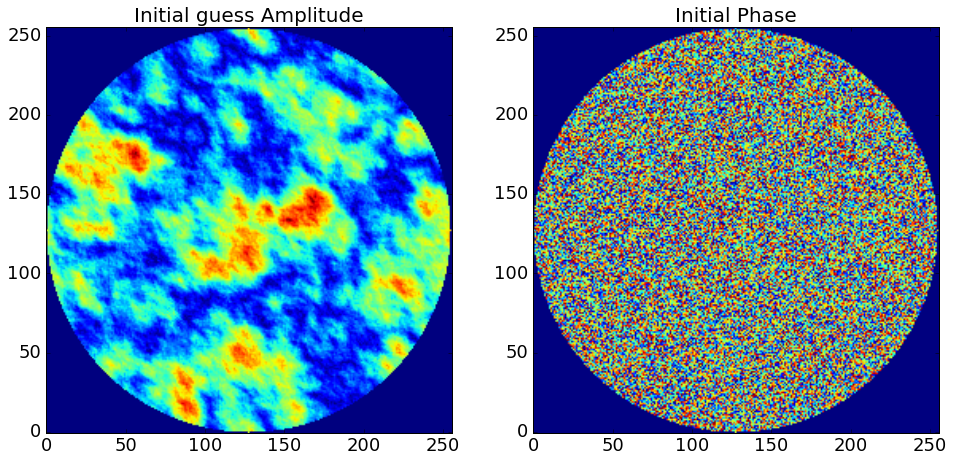

Current step : 100
        Error: 1.66e-02
Current step : 200
        Error: 1.61e-02
Current step : 300
        Error: 1.53e-02
Current step : 400
        Error: 1.43e-02
Current step : 500
        Error: 1.56e-02
Current step : 600
        Error: 1.52e-02
Current step : 700
        Error: 1.68e-02
Current step : 800
        Error: 1.56e-02
Current step : 900
        Error: 1.49e-02
Current step : 1000
        Error: 1.62e-02
Current step : 1100
        Error: 1.69e-02
Current step : 1200
        Error: 1.61e-02
Current step : 1300
        Error: 1.42e-02
Current step : 1400
        Error: 1.53e-02
Current step : 1500
        Error: 1.45e-02
Current step : 1600
        Error: 1.52e-02
Current step : 1700
        Error: 1.35e-02
Current step : 1800
        Error: 1.36e-02
Current step : 1900
        Error: 1.13e-02
Current step : 2000
        Error: 1.60e-02
-----------------------
Initial Error: 2.22e-02
Final step : 2000
Final Error: 1.60e-02


In [49]:
ER_pup,ER_foc = PR_ER(B,threshold=1e-3)

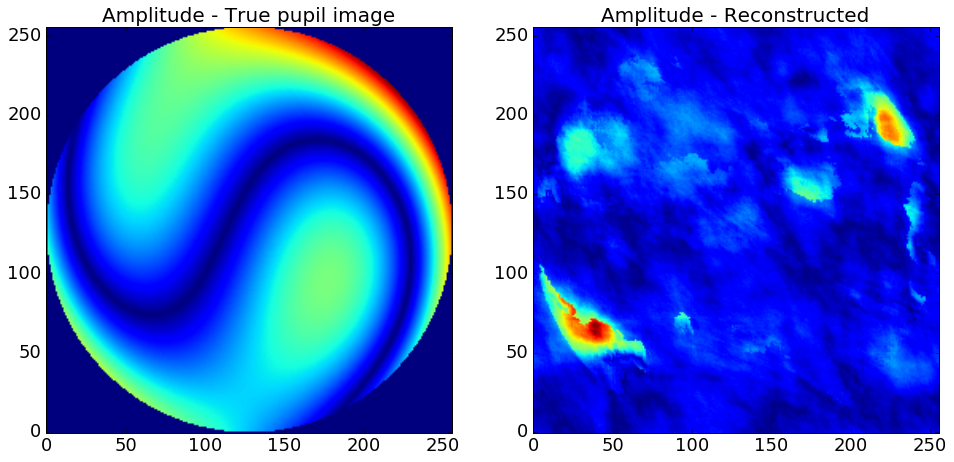

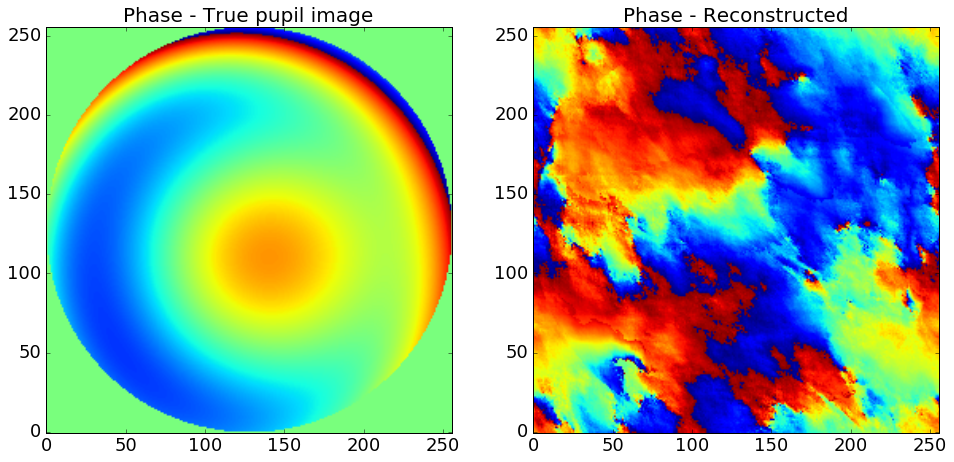

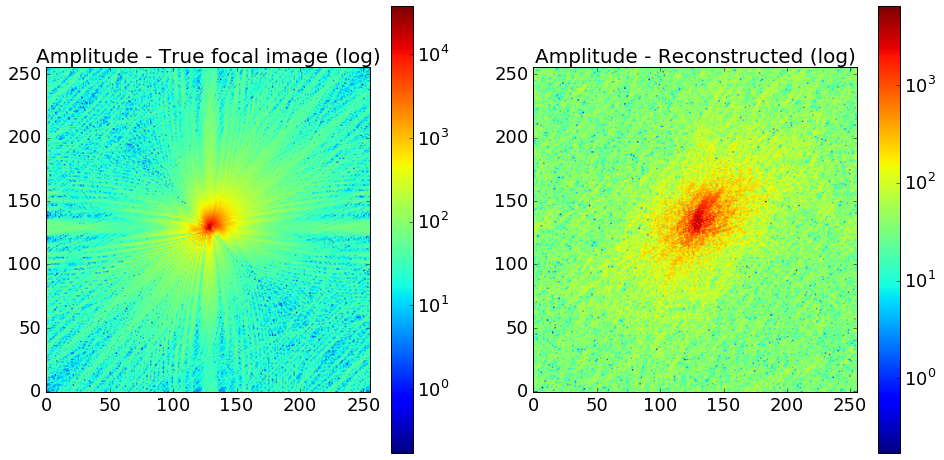

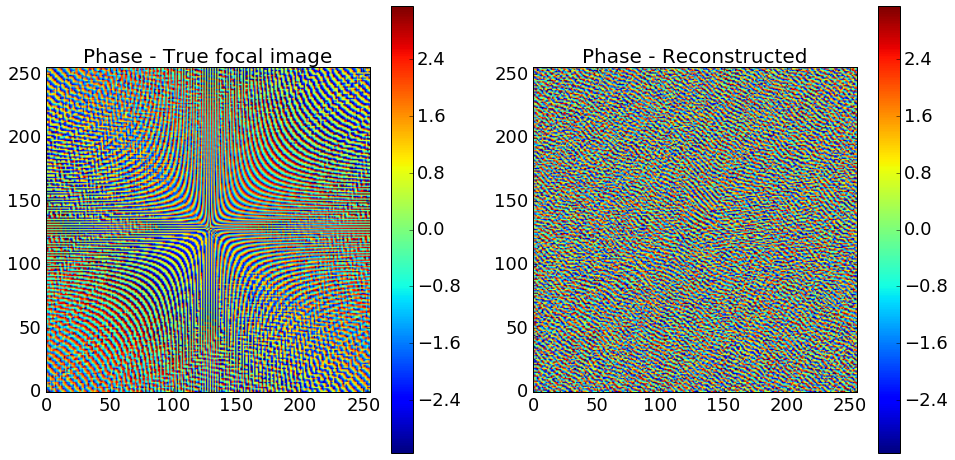

In [50]:
plot_recon(A_,B_,ER_pup,ER_foc)

In the Fourier domain (i.e. focal/diffraction plane) the reconstruction is moderate, but apparently quite bad in the other one, and for phases, let's inspect the residual percentage (w.r.t. true phase):

rms residual error (in phase) = 163.61 %


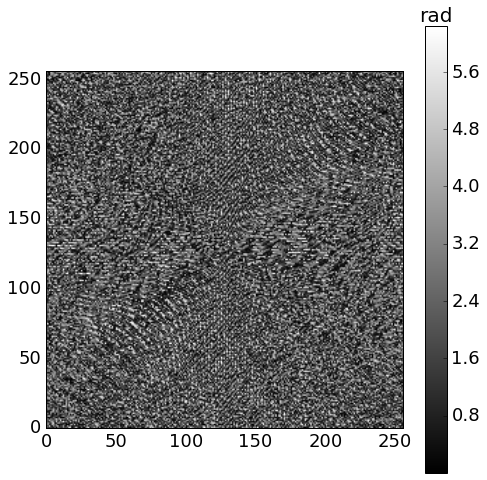

In [51]:
plot_phase_residual(B_,ER_foc)

Awful. BTW, adding 'positivity' constraint seemed to break the (original local) convergence

---
### HIO
_This one is much slower than ER just because of the masking stuff. Bad coding..._

#### First trial: $\beta=1$

In [43]:
Npix = 256
## TRUE inputs (will be UNKNOWN)
zer  = Zernike(Z1=0.7,Z3=0.3,Z4=1.5,Z8=1.,Z13=0.4,Npix=Npix)
zerr = Zernike(Z2=0.2,Z3=0.5,Z7=0.1,Z11=0.1,Npix=Npix)
Aamp = abs(zer.crCartAber(plot=False))
Apha = zerr.crCartAber(plot=False)

A_ = Aamp*np.exp(1j*Apha)
A = abs(A_)**2

## TRUE image (the only input)
B_rec = np.fft.fftshift(np.fft.fft2(A_))
B_ = B_rec
Bamp = abs(B_)
Bpha = np.arctan2(B_.imag,B_.real)
B = Bamp**2

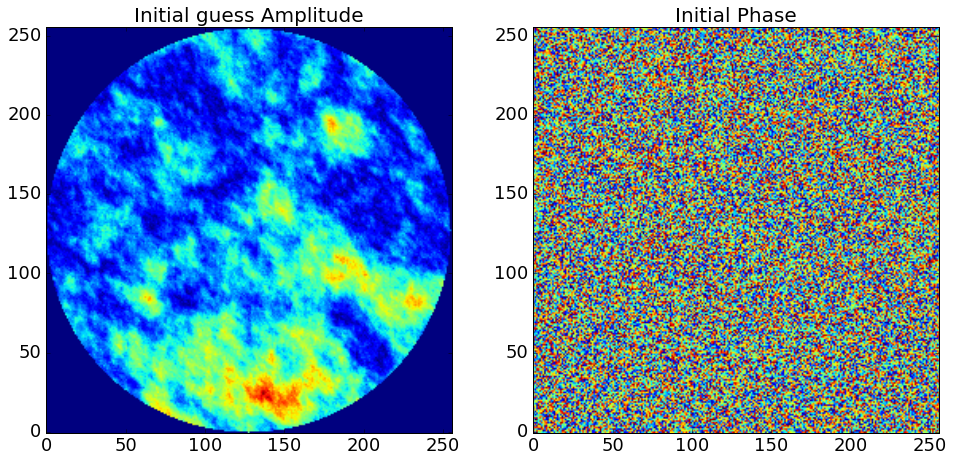

Current step : 100
        Error: 9.28e-02
Current step : 200
        Error: 2.56e-01
Current step : 300
        Error: 1.02e+00
Current step : 400
        Error: 1.14e+00
Current step : 500
        Error: 9.92e-01
Current step : 600
        Error: 1.14e+00
Current step : 700
        Error: 2.01e+00
Current step : 800
        Error: 1.12e+00
Current step : 900
        Error: 1.64e-01
Current step : 1000
        Error: 7.98e-01
Current step : 1100
        Error: 1.73e+00
Current step : 1200
        Error: 2.33e+00
Current step : 1300
        Error: 3.13e+00
Current step : 1400
        Error: 2.80e+00
Current step : 1500
        Error: 1.14e-01
Current step : 1600
        Error: 6.55e-01
Current step : 1700
        Error: 4.63e-02
Current step : 1800
        Error: 4.83e-02
Current step : 1900
        Error: 2.09e-01
Current step : 2000
        Error: 4.57e-02
-----------------------
Initial Error: 2.32e-02
Final step : 2000
Final Error: 4.57e-02


In [37]:
HIO_pup,HIO_foc = PR_HIO(B,beta=1.,threshold=1e-3)

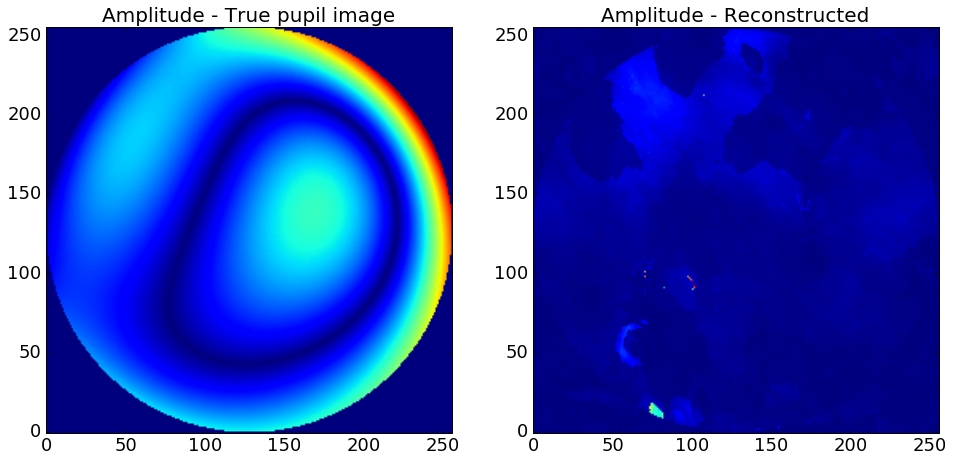

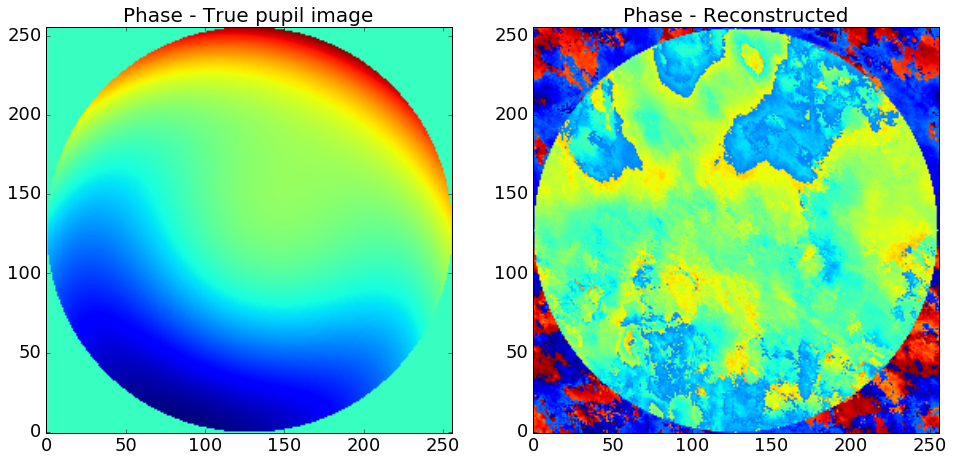

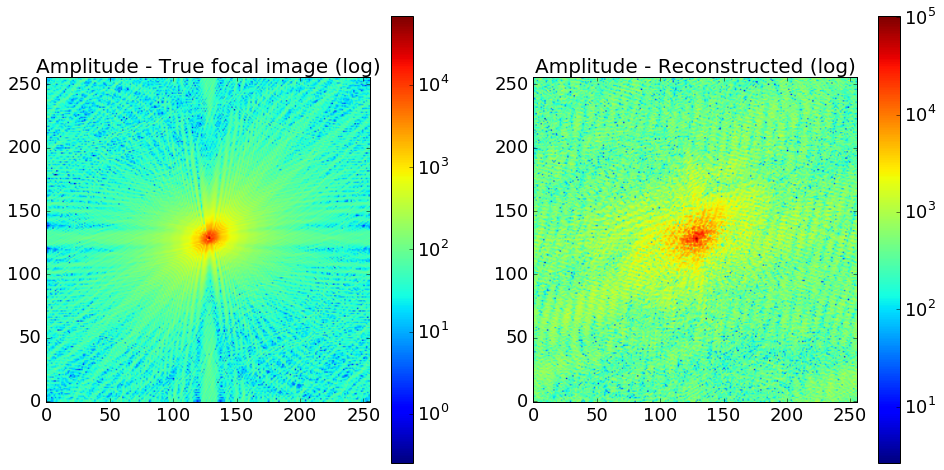

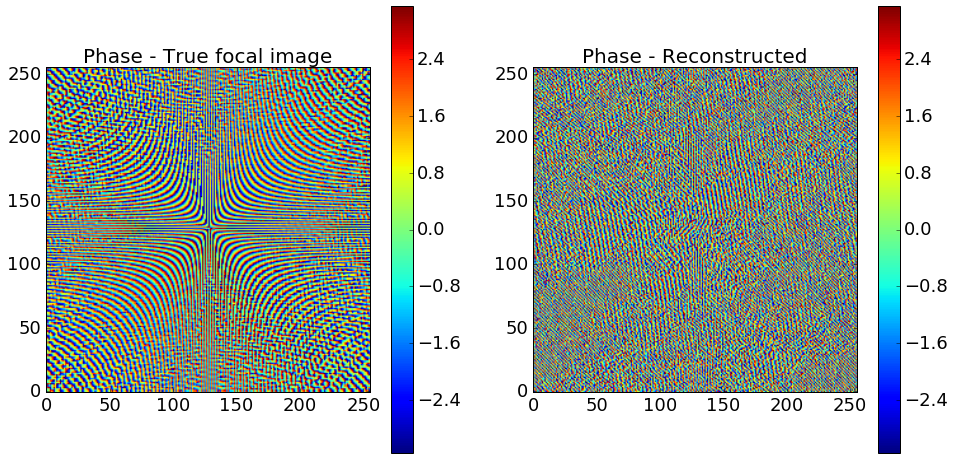

In [38]:
plot_recon(A_,B_,HIO_pup,HIO_foc)

rms residual error (in phase) = 162.58 %


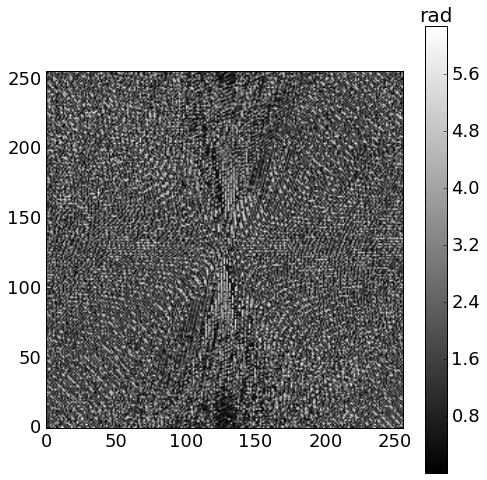

In [39]:
plot_phase_residual(B_,HIO_foc)

Got divergence... 
#### Try $\beta=0.5$

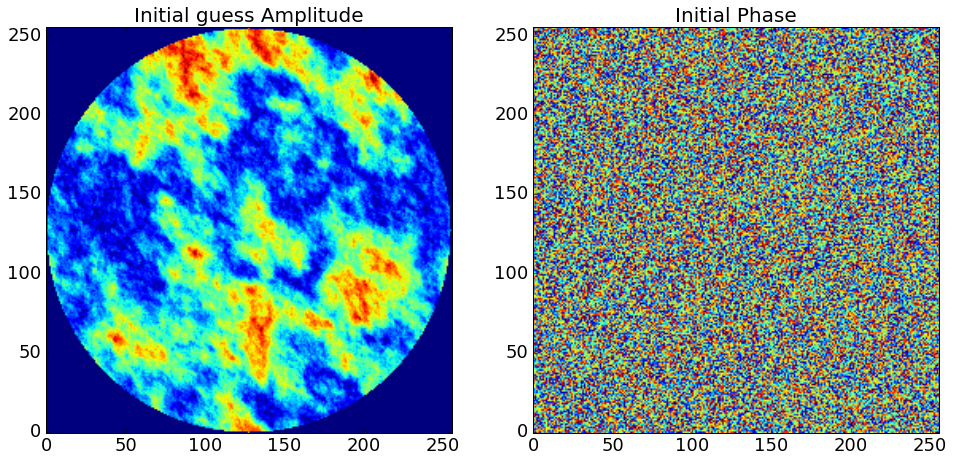

Current step : 100
        Error: 6.40e-02
Current step : 200
        Error: 1.46e-01
Current step : 300
        Error: 3.52e-01
Current step : 400
        Error: 3.32e-01
Current step : 500
        Error: 7.10e-01
Current step : 600
        Error: 1.04e+00
Current step : 700
        Error: 1.26e+00
Current step : 800
        Error: 1.46e+00
Current step : 900
        Error: 1.08e+00
Current step : 1000
        Error: 9.70e-02
Current step : 1100
        Error: 3.87e-01
Current step : 1200
        Error: 2.95e-01
Current step : 1300
        Error: 1.28e-01
Current step : 1400
        Error: 2.23e-01
Current step : 1500
        Error: 7.09e-02
Current step : 1600
        Error: 3.24e-01
Current step : 1700
        Error: 3.58e-01
Current step : 1800
        Error: 5.43e-01
Current step : 1900
        Error: 9.60e-01
Current step : 2000
        Error: 1.20e+00
-----------------------
Initial Error: 2.28e-02
Final step : 2000
Final Error: 1.20e+00


In [40]:
HIO_pup_2,HIO_foc_2 = PR_HIO(B,beta=0.5,threshold=1e-3)

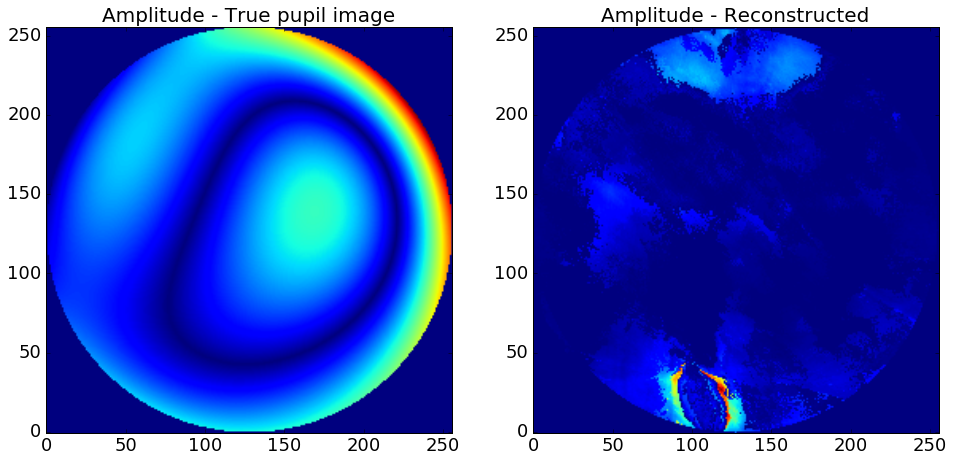

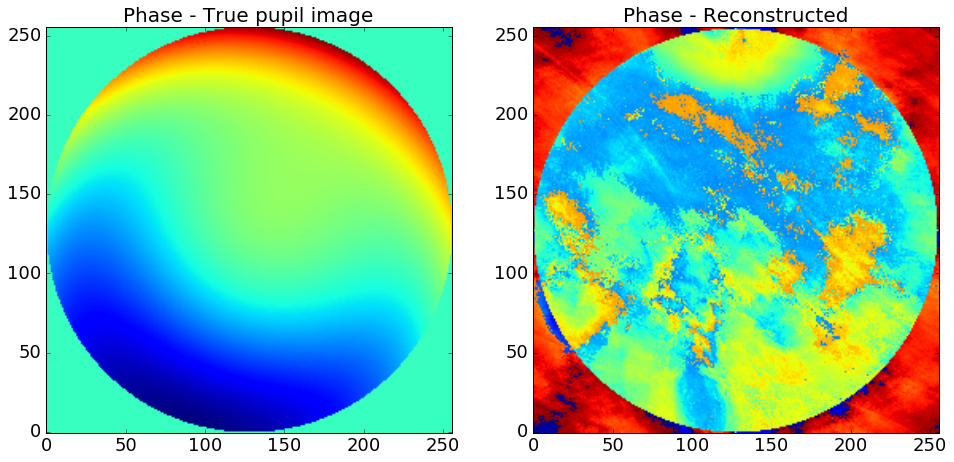

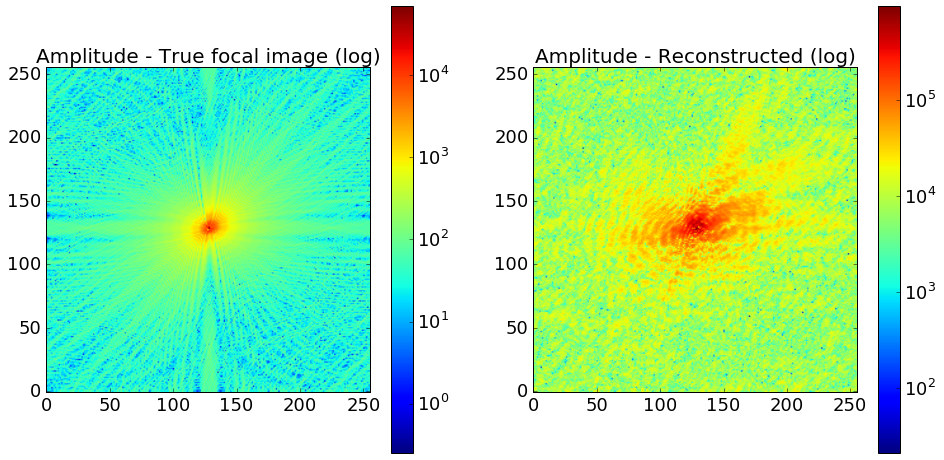

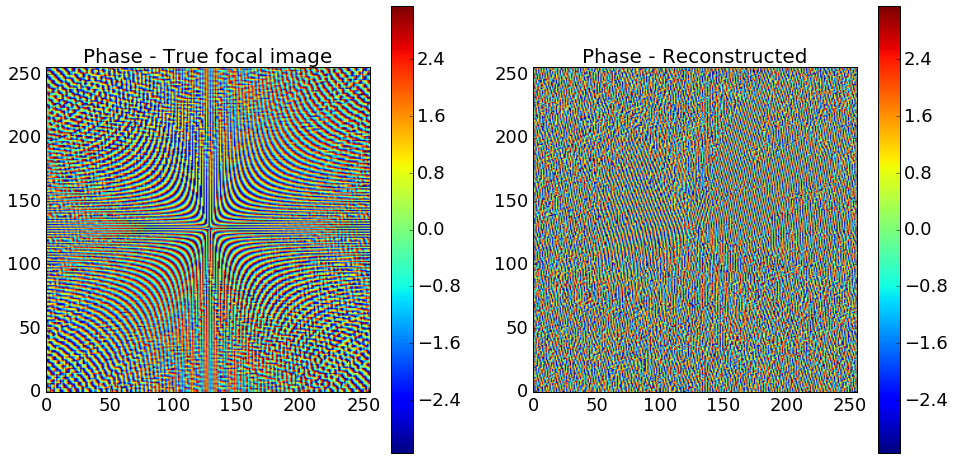

In [41]:
plot_recon(A_,B_,HIO_pup_2,HIO_foc_2)

rms residual error (in phase) = 163.28 %


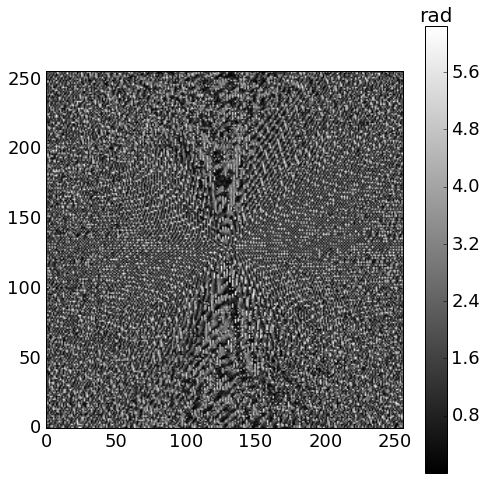

In [42]:
plot_phase_residual(B_,HIO_foc_2)

## <font color="red">Plot err_list / plot final error v.s. beta / check reducing to ER in OO</font>

In [26]:
aa = np.ones((6,6))
bb = np.zeros((6,6))
npix = aa.shape[0]*aa.shape[1]
np.sqrt(np.sum((aa-bb)**2)/npix)/np.sum(abs(aa)/npix)*100

100.0

In [25]:
npix

36